In [1]:
! pip install albumentations==0.4.5

In [2]:
import shutil
try:
    shutil.rmtree("/content/EVA6")
except:
    pass

In [3]:
!git clone https://github.com/abishek-raju/EVA6.git

Cloning into 'EVA6'...
remote: Enumerating objects: 504, done.
remote: Counting objects: 100% (504/504), done.
remote: Compressing objects: 100% (328/328), done.
remote: Total 504 (delta 291), reused 355 (delta 145), pack-reused 0
Receiving objects: 100% (504/504), 6.89 MiB | 12.23 MiB/s, done.
Resolving deltas: 100% (291/291), done.


In [4]:
%cd /content/EVA6/

/content/EVA6


In [5]:
from p81.main import main

In [6]:
configuration = {"dataset" : "CIFAR10",
                 "tr_batch_size" : 64,
                 
                 "tst_batch_size" : 64,
                 
                 "device" : "cuda",
                 "dev_kwargs" : {'num_workers': 8, 'pin_memory': True},
                 
                 "epochs" : 10,
                 
                 "max_misclassified_images" : 40,
                 "max_classified_images" : 20}

Files already downloaded and verified


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


Files already downloaded and verified
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 32, 32]           1,728
         GroupNorm-2           [-1, 64, 32, 32]             128
            Conv2d-3           [-1, 64, 32, 32]          36,864
         GroupNorm-4           [-1, 64, 32, 32]             128
            Conv2d-5           [-1, 64, 32, 32]          36,864
         GroupNorm-6           [-1, 64, 32, 32]             128
        BasicBlock-7           [-1, 64, 32, 32]               0
            Conv2d-8           [-1, 64, 32, 32]          36,864
         GroupNorm-9           [-1, 64, 32, 32]             128
           Conv2d-10           [-1, 64, 32, 32]          36,864
        GroupNorm-11           [-1, 64, 32, 32]             128
       BasicBlock-12           [-1, 64, 32, 32]               0
           Conv2d-13          [-1, 128, 16, 16]          73,728
 

/usr/local/lib/python3.7/dist-packages/torch/_tensor.py:575: UserWarning: floor_divide is deprecated, and will be removed in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values.
To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor'). (Triggered internally at  /pytorch/aten/src/ATen/native/BinaryOps.cpp:467.)
  return torch.floor_divide(self, other)



Train_epoch :  14.293999969959259
Test_epoch :  21.08999937772751
Learning Rate :  0.1



Train_epoch :  24.065999686717987
Test_epoch :  25.619998574256897
Learning Rate :  0.1



Train_epoch :  28.47999930381775
Test_epoch :  29.580000042915344
Learning Rate :  0.1



Train_epoch :  31.112000346183777
Test_epoch :  31.97000026702881
Learning Rate :  0.1



Train_epoch :  33.84999930858612
Test_epoch :  35.44999957084656
Learning Rate :  0.1



Train_epoch :  36.19999885559082
Test_epoch :  35.62999963760376
Learning Rate :  0.1



Train_epoch :  39.25599753856659
Test_epoch :  35.8599990606308
Learning Rate :  0.1



Train_epoch :  41.25199913978577
Test_epoch :  39.19999897480011
Learning Rate :  0.1



Train_epoch :  43.87199878692627
Test_epoch :  43.88999938964844
Learning Rate :  0.1


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

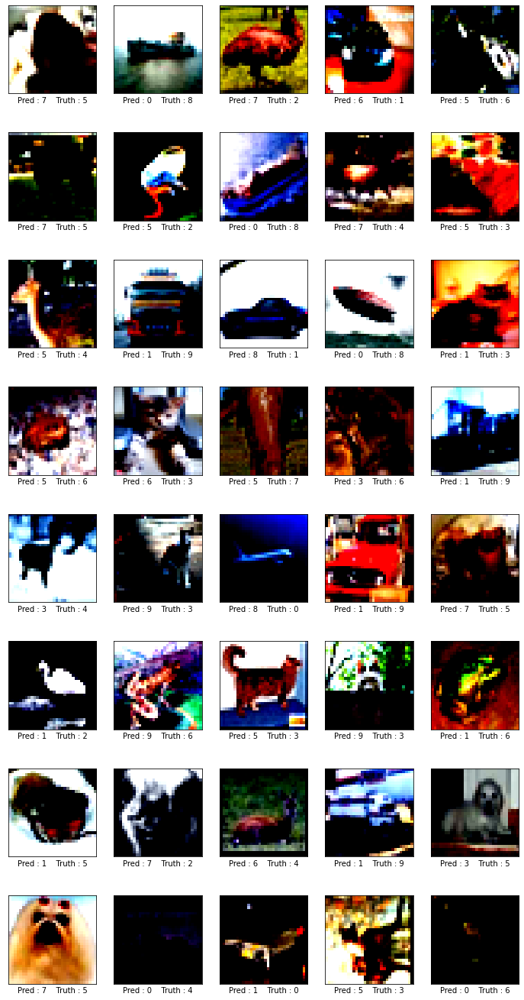

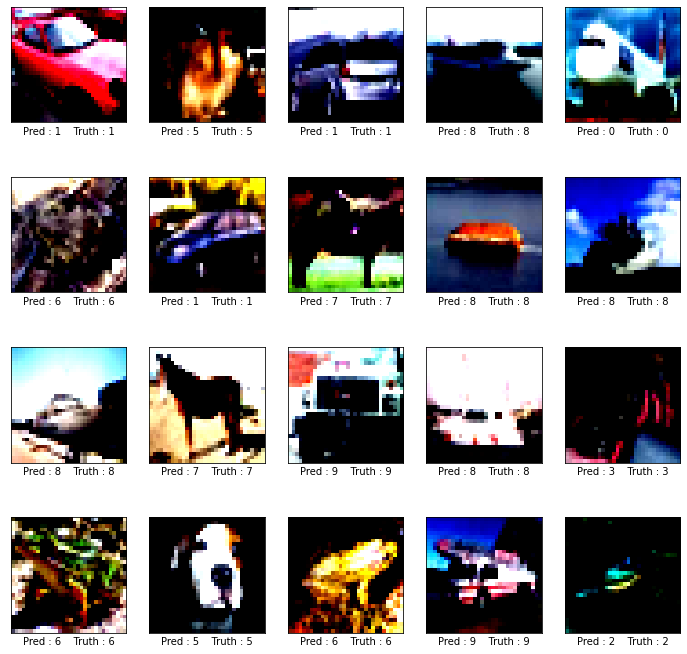

In [7]:
model,log_exp = main(configuration)

In [8]:
%load_ext tensorboard
%tensorboard --logdir /content/EVA6/runs
# %reload_ext tensorboard

Reusing TensorBoard on port 6006 (pid 448), started 5:19:46 ago. (Use '!kill 448' to kill it.)

<IPython.core.display.Javascript object>

In [9]:
# !pip install grad-cam
# ! pip install ttach

In [10]:
import torch

In [14]:
# input_tensor,labels = next(iter(train_loader))

In [42]:
input_tensor = mis_img[index].unsqueeze(0)

In [43]:
from pytorch_grad_cam import GradCAM, ScoreCAM, GradCAMPlusPlus, AblationCAM, XGradCAM, EigenCAM
from pytorch_grad_cam.utils.image import show_cam_on_image

#model = resnet50(pretrained=True)
target_layer = model.layer3[-1]
#input_tensor = # Create an input tensor image for your model..
# Note: input_tensor can be a batch tensor with several images!

# Construct the CAM object once, and then re-use it on many images:
cam = GradCAM(model=model, target_layer=target_layer, use_cuda=True)

# If target_category is None, the highest scoring category
# will be used for every image in the batch.
# target_category can also be an integer, or a list of different integers
# for every image in the batch.
target_category = 1

# You can also pass aug_smooth=True and eigen_smooth=True, to apply smoothing.
grayscale_cam = cam(input_tensor=input_tensor, target_category=target_category)

# In this example grayscale_cam has only one image in the batch:
# grayscale_cam = grayscale_cam[0, :]
# visualization = show_cam_on_image(np.array(input_tensor).transpose(0,2,3,1).astype(np.uint8).shape, grayscale_cam)

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/module.py:974: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


In [62]:
grayscale_cam.shape

(1, 32, 32)

In [65]:
temp = cv2.applyColorMap(np.uint8(255 * grayscale_cam[0]), cv2.COLORMAP_JET) 

In [23]:
import cv2
import numpy as np
gray_list = [cv2.applyColorMap(np.uint8(255 * i), cv2.COLORMAP_JET) for i in grayscale_cam]

NameError: ignored

In [24]:
from p81.data import test_dataloader_obj
test_loader = test_dataloader_obj(dataset = configuration["dataset"],
                                    batch_size = configuration["tst_batch_size"],
                                    dataloader_kwargs = configuration["dev_kwargs"])
input_tensor,labels = next(iter(test_loader))

Files already downloaded and verified


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


In [ ]:
image_to_look = 2

In [99]:
classes = train_loader.dataset.cifar_.classes[labels[image_to_look]]

NameError: ignored

In [25]:
#!/usr/bin/env python
# _*_ coding:utf-8 _*_
import torch
import cv2
from google.colab.patches import cv2_imshow
 
def save_image_tensor2cv2(input_tensor: torch.Tensor):
    """
    Save tensor to cv2 format
         :param input_tensor: tensor to save
         :param filename: saved file name
    """
    assert (len(input_tensor.shape) == 4 and input_tensor.shape[0] == 1)
         # Make a copy
    input_tensor = input_tensor.clone().detach()
         # To cpu
    input_tensor = input_tensor.to(torch.device('cpu'))
         # Denormalization
    # input_tensor = unnormalize(input_tensor)
         # Remove batch dimension
    input_tensor = input_tensor.squeeze()
         # Convert from [0,1] to [0,255], then from CHW to HWC, and finally to cv2
    input_tensor = input_tensor.mul_(255).add_(0.5).clamp_(0, 255).permute(1, 2, 0).type(torch.uint8).numpy()
         # RGB to BRG
    input_tensor = cv2.cvtColor(input_tensor, cv2.COLOR_RGB2BGR)
    return input_tensor

In [69]:
input_tensor.shape

torch.Size([1, 3, 32, 32])

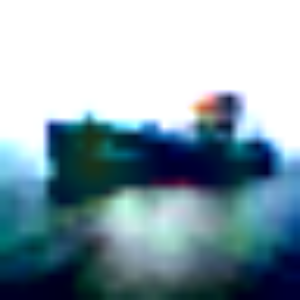

In [72]:
cvdasfd = save_image_tensor2cv2(input_tensor)
cv2_imshow(cv2.resize(temp * 0.2 + cvdasfd,(300,300)))

In [ ]:
cv2_imshow(cv2.resize(cvdasfd,(300,300)))

In [ ]:
labels[0]

In [18]:
mis_img,mis_grnd_truth,mis_pred = log_exp.misclassified_images

In [93]:
def generate_grad_cam(model,target_layer,target_category,input_tensor):
    cam = GradCAM(model=model, target_layer=target_layer, use_cuda=True)
    grayscale_cam = cam(input_tensor=input_tensor, target_category=target_category)
    print(grayscale_cam.shape)
    gray_list = cv2.applyColorMap(np.uint8(255 * grayscale_cam[0]), cv2.COLORMAP_JET)
    original_image = save_image_tensor2cv2(input_tensor)
    
    super_imposed = gray_list * 0.4 + original_image
    # cv2_imshow(cv2.resize(super_imposed,(300,300)))
    return super_imposed

In [36]:
target_layer = model.layer3[-1]

In [35]:
mis_img[index].unsqueeze(0).shape

torch.Size([1, 3, 32, 32])

In [50]:
mis_img[index].unsqueeze(0).to("cpu").shape

torch.Size([1, 3, 32, 32])

In [89]:
mis_img[index].permute(1,2,0)

torch.Size([32, 32, 3])

In [101]:
classes = ["airplane",									
"automobile",										
"bird",										
"cat",									
"deer",										
"dog",									
"frog",									
"horse",										
"ship",									
"truck"]

(1, 32, 32)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/module.py:974: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/usr/local/lib/python3.7/dist-packages/pytorch_grad_cam/base_cam.py:85: RuntimeWarning: invalid value encountered in true_divide
  img = img / np.max(img)


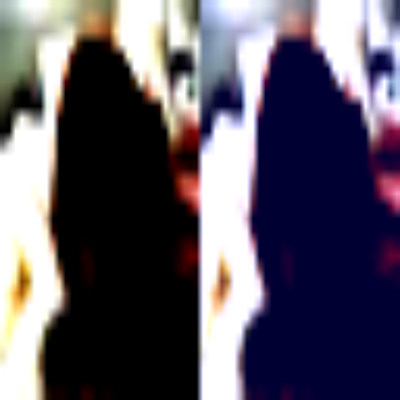

Pred : horse Ground_truth : dog
(1, 32, 32)


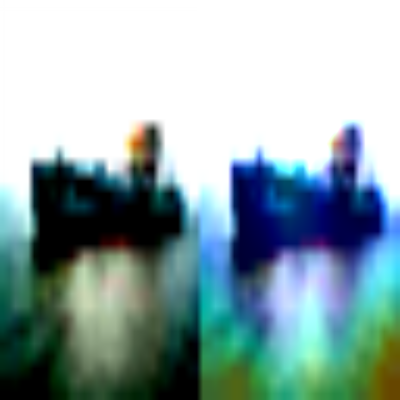

Pred : airplane Ground_truth : ship
(1, 32, 32)


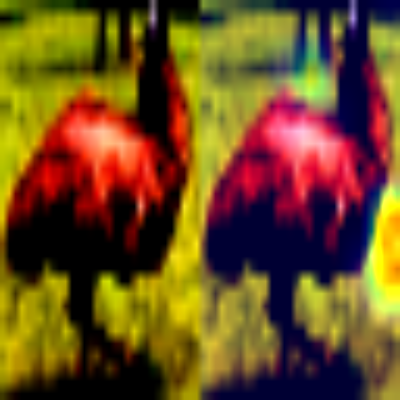

Pred : horse Ground_truth : bird
(1, 32, 32)


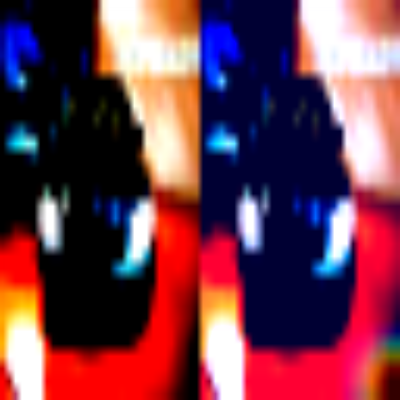

Pred : frog Ground_truth : automobile
(1, 32, 32)


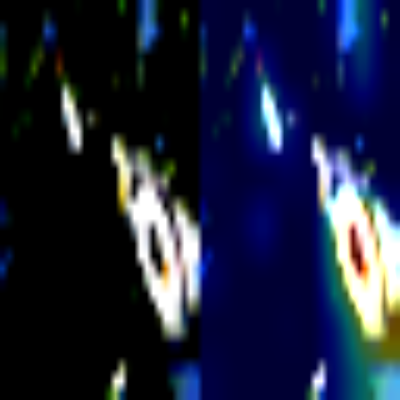

Pred : dog Ground_truth : frog
(1, 32, 32)


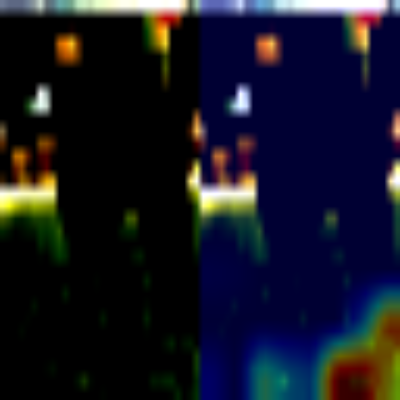

Pred : horse Ground_truth : dog
(1, 32, 32)


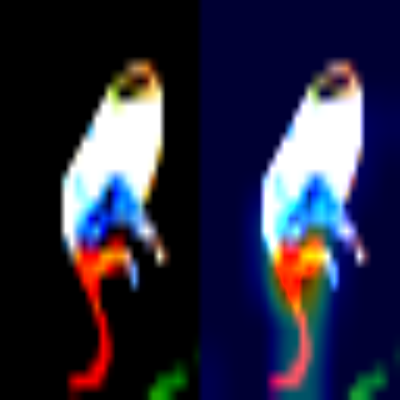

Pred : dog Ground_truth : bird
(1, 32, 32)


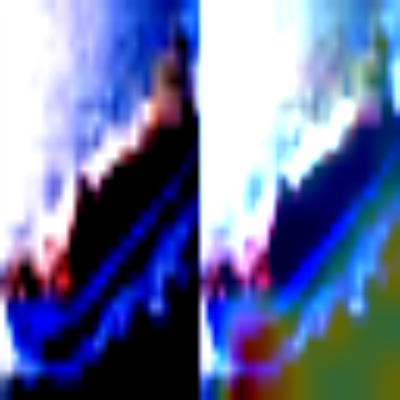

Pred : airplane Ground_truth : ship
(1, 32, 32)


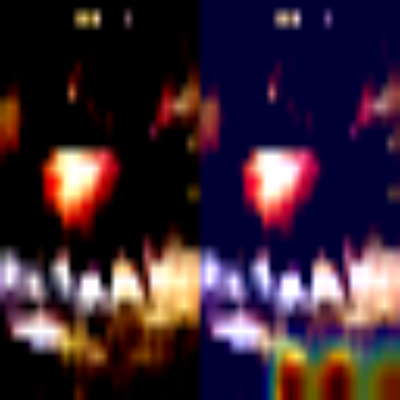

Pred : horse Ground_truth : deer
(1, 32, 32)


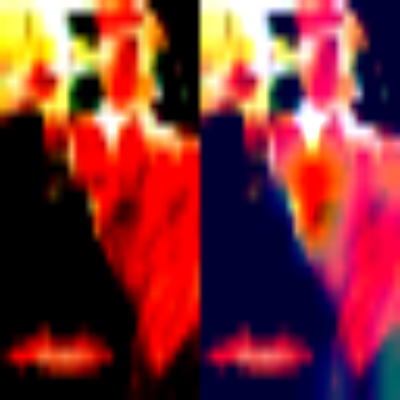

Pred : dog Ground_truth : cat
(1, 32, 32)


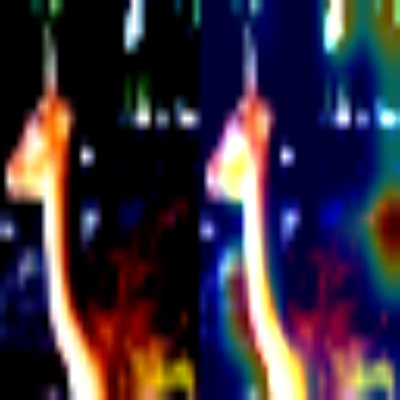

Pred : dog Ground_truth : deer
(1, 32, 32)


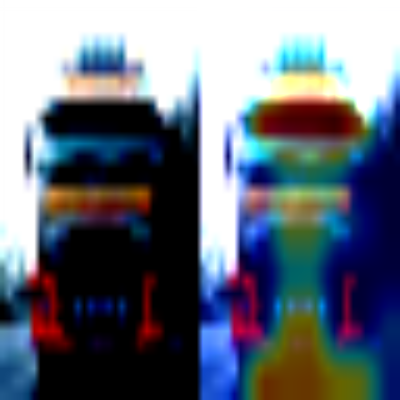

Pred : automobile Ground_truth : truck
(1, 32, 32)


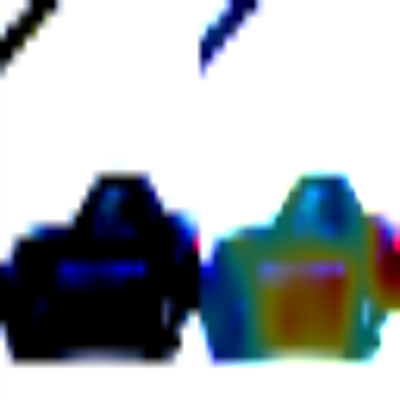

Pred : ship Ground_truth : automobile
(1, 32, 32)


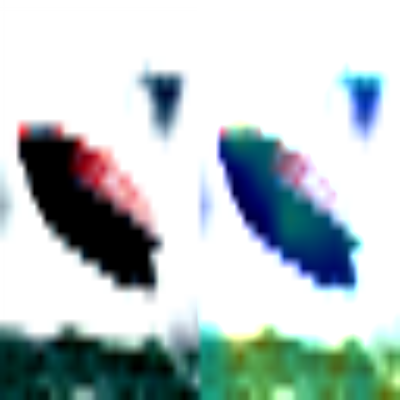

Pred : airplane Ground_truth : ship
(1, 32, 32)


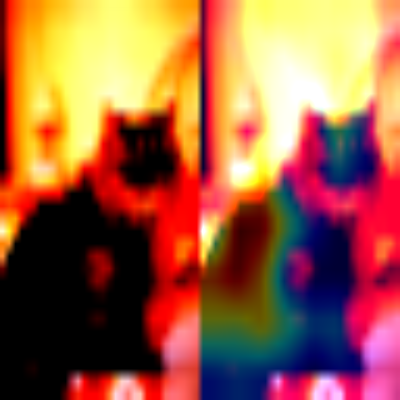

Pred : automobile Ground_truth : cat
(1, 32, 32)


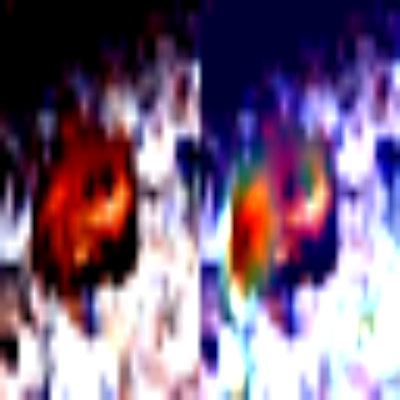

Pred : dog Ground_truth : frog
(1, 32, 32)


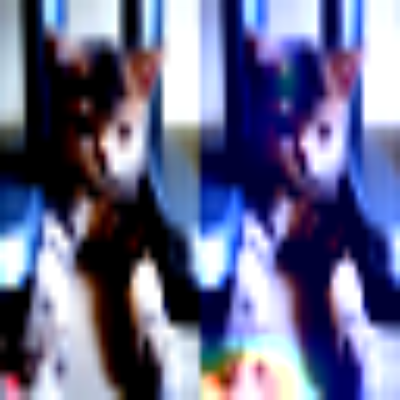

Pred : frog Ground_truth : cat
(1, 32, 32)


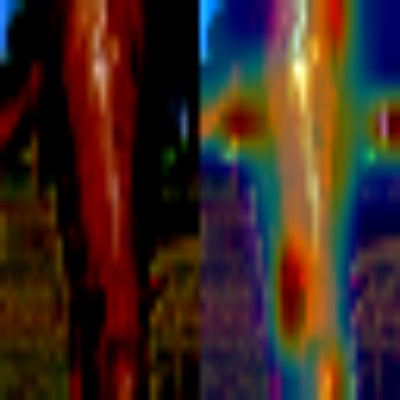

Pred : dog Ground_truth : horse
(1, 32, 32)


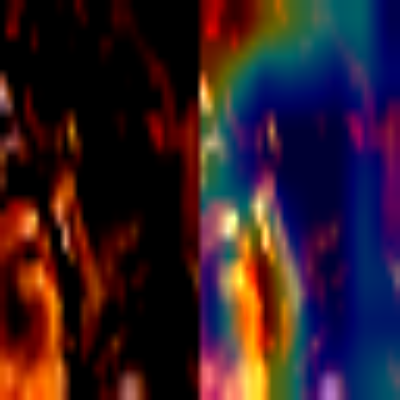

Pred : cat Ground_truth : frog
(1, 32, 32)


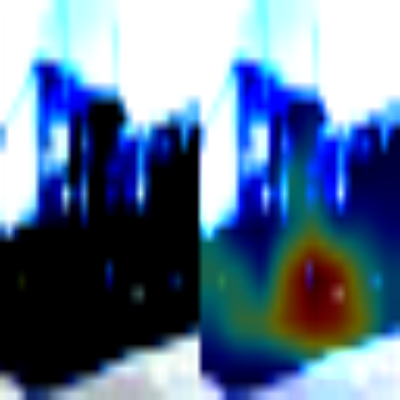

Pred : automobile Ground_truth : truck
(1, 32, 32)


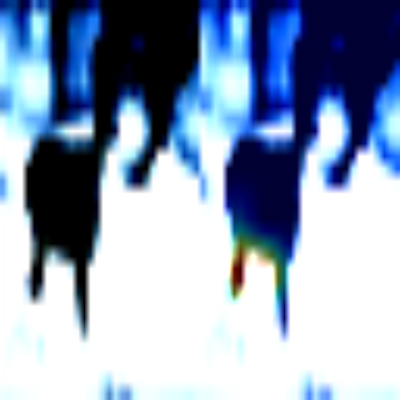

Pred : cat Ground_truth : deer
(1, 32, 32)


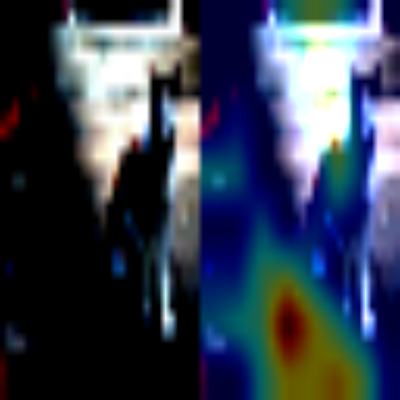

Pred : truck Ground_truth : cat
(1, 32, 32)


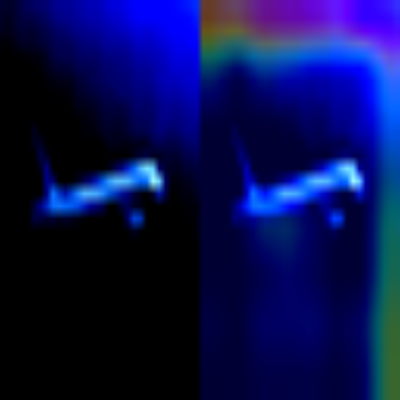

Pred : ship Ground_truth : airplane
(1, 32, 32)


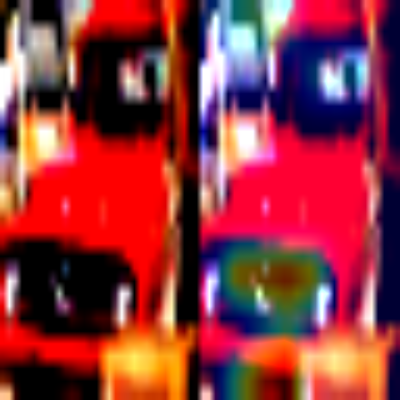

Pred : automobile Ground_truth : truck
(1, 32, 32)


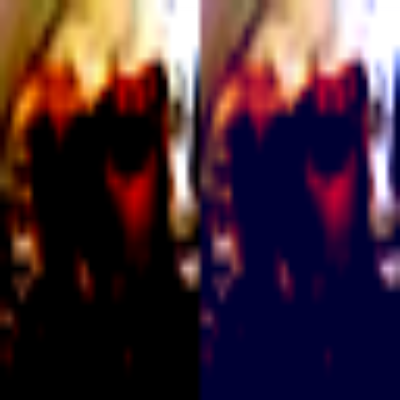

Pred : horse Ground_truth : dog
(1, 32, 32)


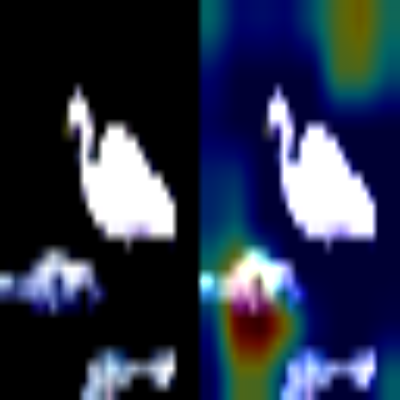

Pred : automobile Ground_truth : bird
(1, 32, 32)


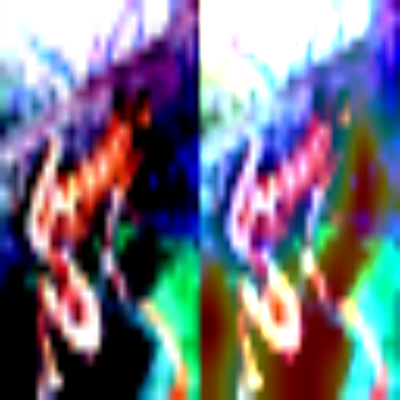

Pred : truck Ground_truth : frog
(1, 32, 32)


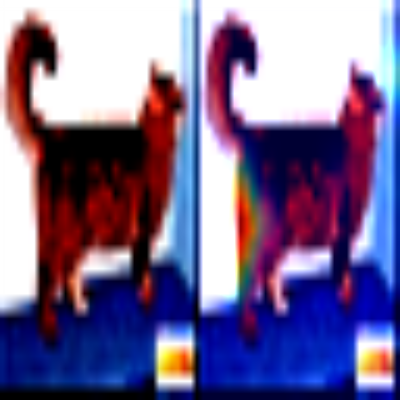

Pred : dog Ground_truth : cat
(1, 32, 32)


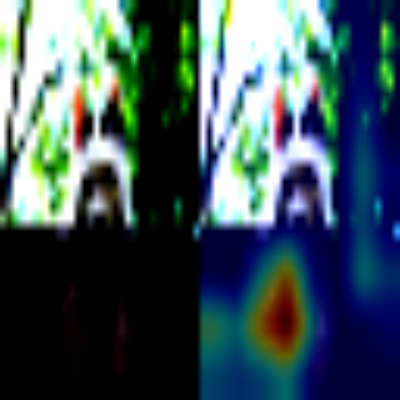

Pred : truck Ground_truth : cat
(1, 32, 32)


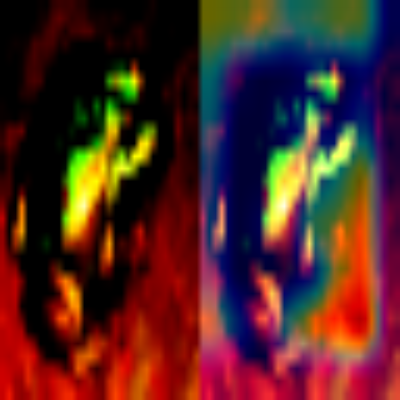

Pred : automobile Ground_truth : frog
(1, 32, 32)


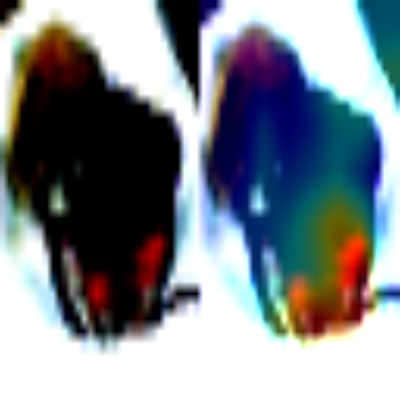

Pred : automobile Ground_truth : dog
(1, 32, 32)


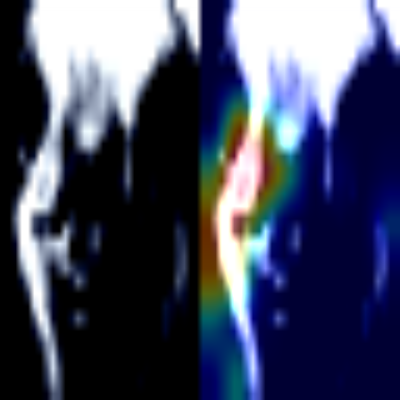

Pred : horse Ground_truth : bird
(1, 32, 32)


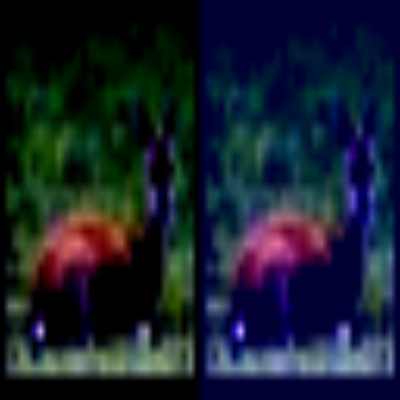

Pred : frog Ground_truth : deer
(1, 32, 32)


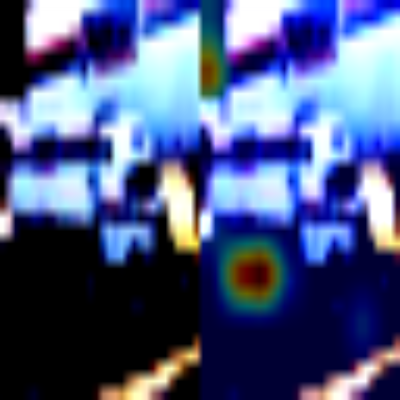

Pred : automobile Ground_truth : truck
(1, 32, 32)


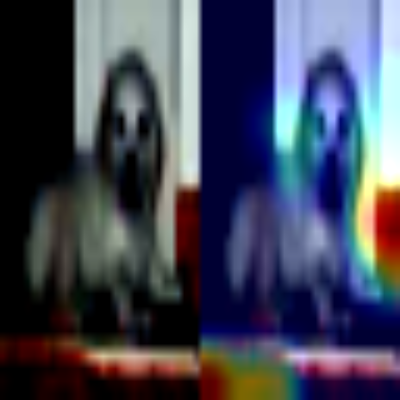

Pred : cat Ground_truth : dog
(1, 32, 32)


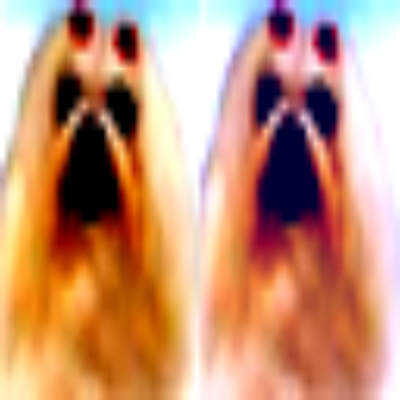

Pred : horse Ground_truth : dog
(1, 32, 32)


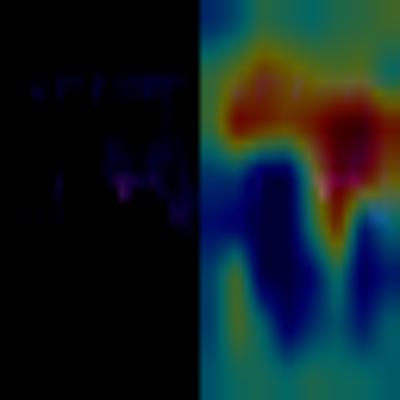

Pred : airplane Ground_truth : deer
(1, 32, 32)


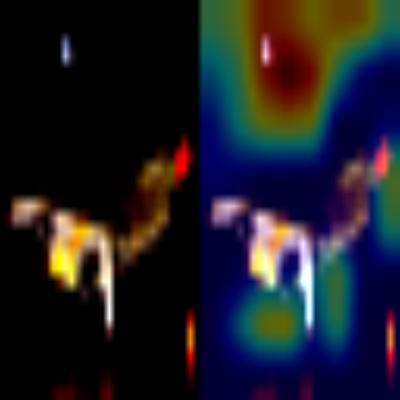

Pred : automobile Ground_truth : airplane
(1, 32, 32)


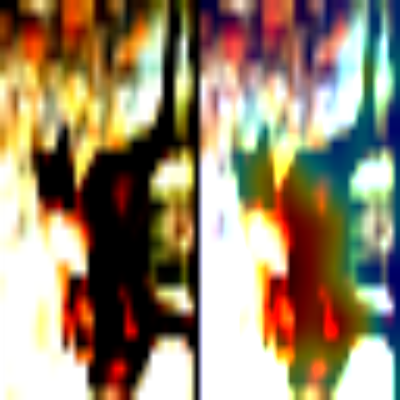

Pred : dog Ground_truth : cat
(1, 32, 32)


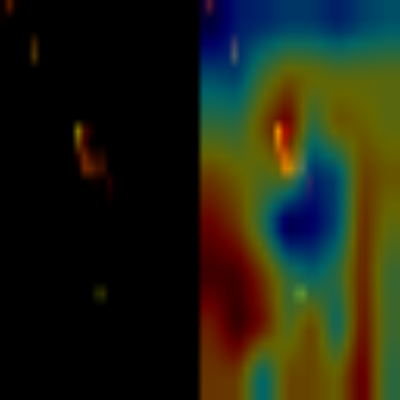

Pred : airplane Ground_truth : frog


In [103]:
for index in range(len(mis_img)):
    # index = 1
    img2 = generate_grad_cam(model,target_layer,mis_pred[index].item(),mis_img[index].unsqueeze(0).to("cpu"))
    combined = np.concatenate((save_image_tensor2cv2(mis_img[index].unsqueeze(0).to("cpu")), img2), axis=1)
    cv2_imshow(cv2.resize(combined,(400,400)))
    print(f'Pred : {classes[mis_pred[index].item()]} Ground_truth : {classes[mis_grnd_truth[index]]}')
    # break

In [104]:
correct_img,correct_grnd_truth,correct_pred = log_exp.classified_images

(1, 32, 32)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/module.py:974: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


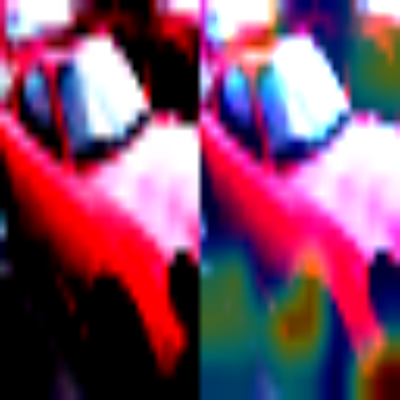

Pred : automobile Ground_truth : automobile
(1, 32, 32)


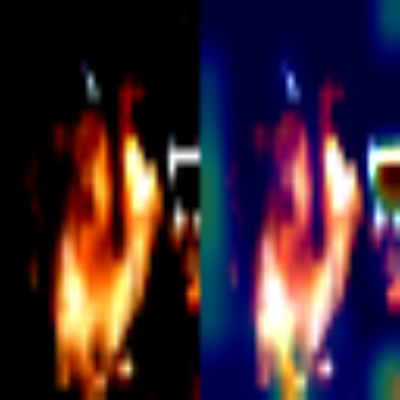

Pred : dog Ground_truth : dog
(1, 32, 32)


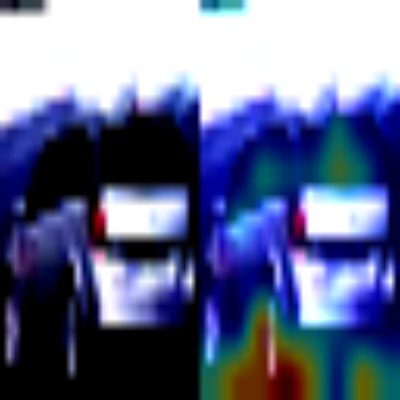

Pred : automobile Ground_truth : automobile
(1, 32, 32)


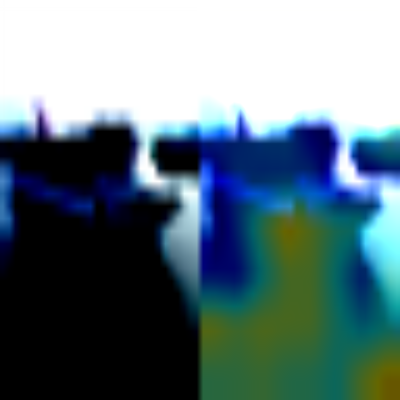

Pred : ship Ground_truth : ship
(1, 32, 32)


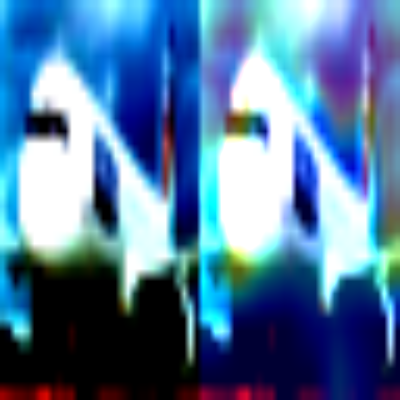

Pred : airplane Ground_truth : airplane
(1, 32, 32)


/usr/local/lib/python3.7/dist-packages/pytorch_grad_cam/base_cam.py:85: RuntimeWarning: invalid value encountered in true_divide
  img = img / np.max(img)


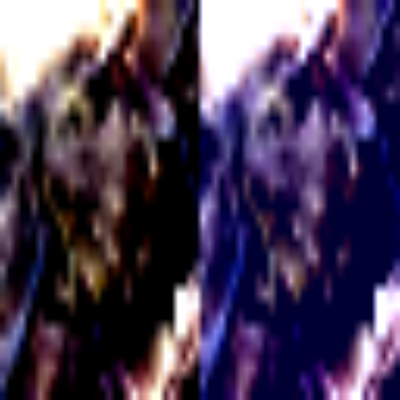

Pred : frog Ground_truth : frog
(1, 32, 32)


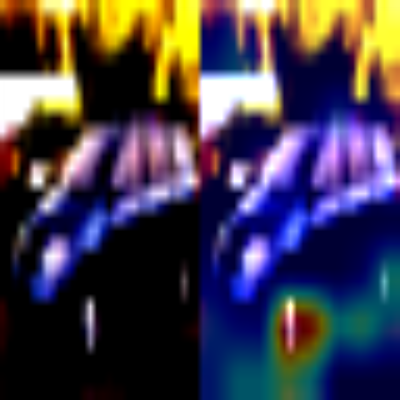

Pred : automobile Ground_truth : automobile
(1, 32, 32)


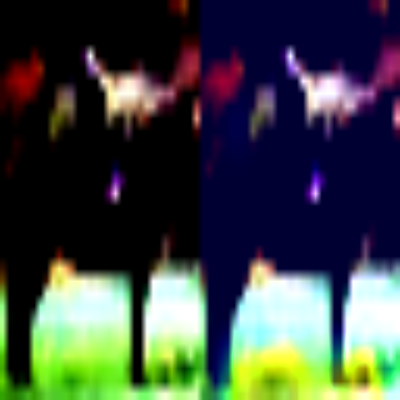

Pred : horse Ground_truth : horse
(1, 32, 32)


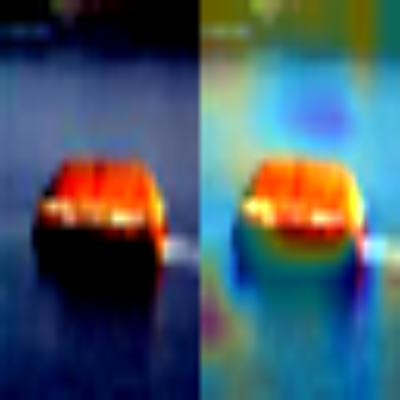

Pred : ship Ground_truth : ship
(1, 32, 32)


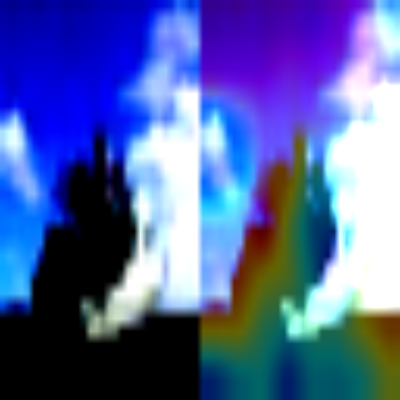

Pred : ship Ground_truth : ship
(1, 32, 32)


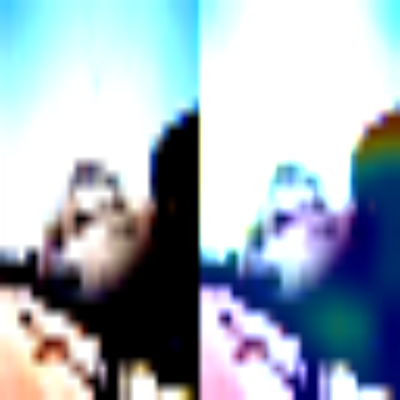

Pred : ship Ground_truth : ship
(1, 32, 32)


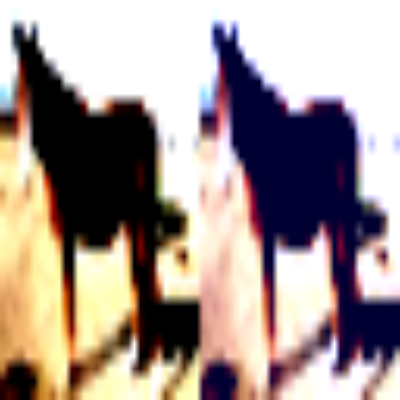

Pred : horse Ground_truth : horse
(1, 32, 32)


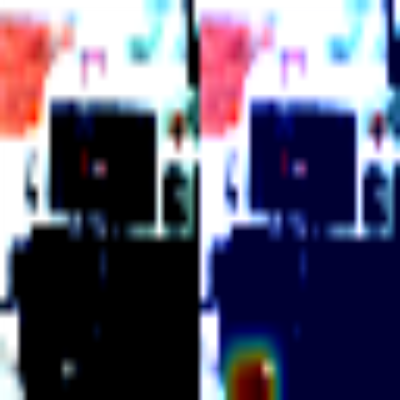

Pred : truck Ground_truth : truck
(1, 32, 32)


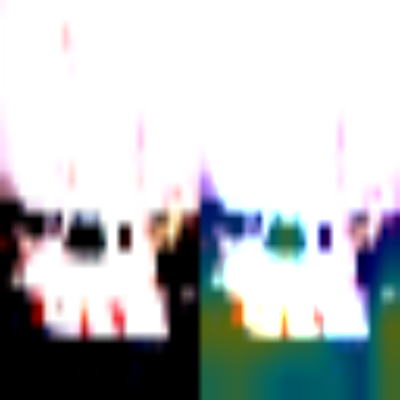

Pred : ship Ground_truth : ship
(1, 32, 32)


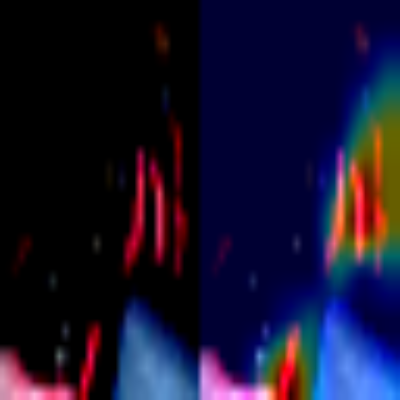

Pred : cat Ground_truth : cat
(1, 32, 32)


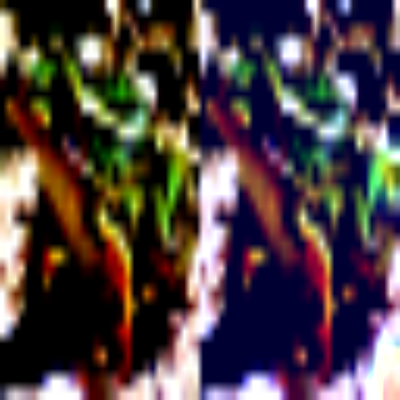

Pred : frog Ground_truth : frog
(1, 32, 32)


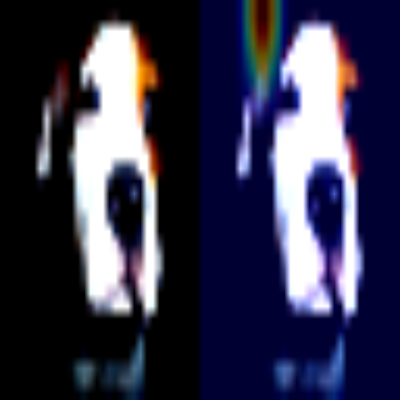

Pred : dog Ground_truth : dog
(1, 32, 32)


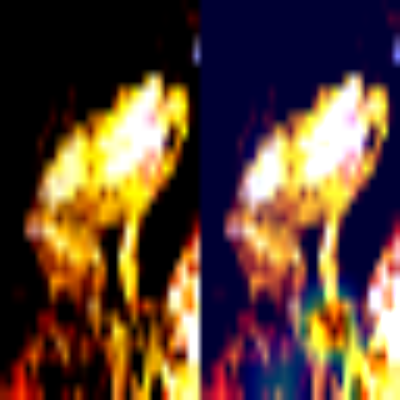

Pred : frog Ground_truth : frog
(1, 32, 32)


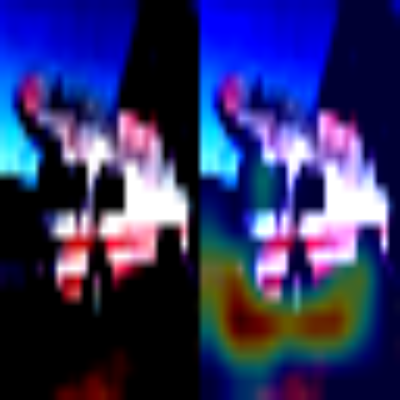

Pred : truck Ground_truth : truck
(1, 32, 32)


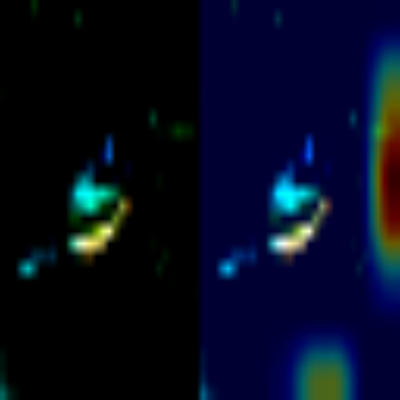

Pred : bird Ground_truth : bird


In [105]:
for index in range(len(correct_img)):
    # index = 1
    img2 = generate_grad_cam(model,target_layer,correct_pred[index].item(),correct_img[index].unsqueeze(0).to("cpu"))
    combined = np.concatenate((save_image_tensor2cv2(correct_img[index].unsqueeze(0).to("cpu")), img2), axis=1)
    cv2_imshow(cv2.resize(combined,(400,400)))
    print(f'Pred : {classes[correct_pred[index].item()]} Ground_truth : {classes[correct_grnd_truth[index]]}')
    # break